In [69]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from matplotlib.colors import LogNorm
from lonboard import Map, PolygonLayer
from lonboard.colormap import apply_categorical_cmap, apply_continuous_cmap
from palettable.colorbrewer.sequential import PuRd_9

In [70]:
data_pd = pd.read_csv("C:/Users/王小雅/1/cdp-mapping-systems/Data/Building_Elevation_and_Subgrade__BES__202407182.csv")

In [71]:
data_pd.columns

Index(['the_geom', 'bin', 'bbl', 'borough', 'block', 'lot', 'address',
       'z_grade', 'z_floor', 'subgrade', 'notes1', 'notes2', 'notes3', 'x',
       'y', 'latitude', 'longitude', 'pluto_bbl', 'Council', 'BoroCD',
       'CTLabel', 'BoroCT2020', 'NTA2020', 'NTAName', 'CDTA2020', 'CDTAName'],
      dtype='object')

In [72]:
data_pd.dtypes

the_geom       object
bin             int64
bbl             int64
borough         int64
block           int64
lot             int64
address        object
z_grade       float64
z_floor       float64
subgrade       object
notes1         object
notes2         object
notes3         object
x             float64
y             float64
latitude      float64
longitude     float64
pluto_bbl       int64
Council         int64
BoroCD          int64
CTLabel       float64
BoroCT2020      int64
NTA2020        object
NTAName        object
CDTA2020       object
CDTAName       object
dtype: object

In [73]:
data_pd.borough.value_counts()

borough
5    73648
3      242
2       15
1        6
4        4
Name: count, dtype: int64

In [74]:
data_pd.z_floor.value_counts()

z_floor
0.000      1590
53.407        8
55.969        7
65.113        6
36.109        6
           ... 
28.299        1
57.339        1
34.873        1
29.127        1
113.713       1
Name: count, Length: 55240, dtype: int64

In [75]:
data_pd.z_floor.describe()

count    73915.000000
mean        68.857200
std         48.531636
min          0.000000
25%         35.830500
50%         58.363000
75%         89.611500
max        397.266000
Name: z_floor, dtype: float64

<Axes: ylabel='Frequency'>

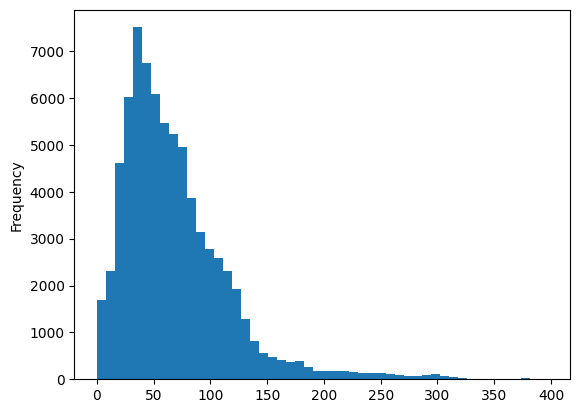

In [76]:
data_pd.z_floor.plot.hist(bins=50)

<Axes: ylabel='Frequency'>

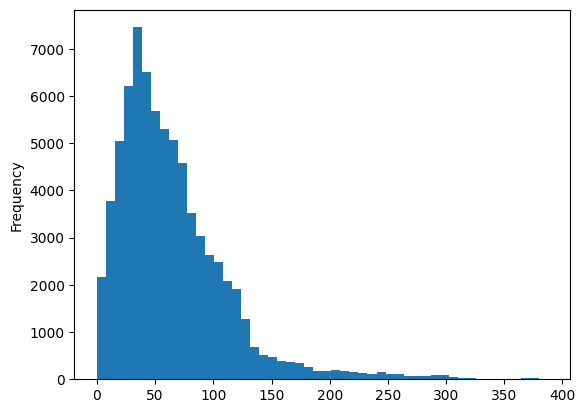

In [77]:
data_pd.z_grade.plot.hist(bins=50)

In [78]:
data_pd['borough'].unique()

array([5, 3, 4, 1, 2])

In [79]:
data_pd['the_geom'].unique()

array(['POINT (-74.22274561187417 40.52134422844183)',
       'POINT (-74.24179250549321 40.52875316810818)',
       'POINT (-74.24109012652094 40.528883822921635)', ...,
       'POINT (-74.16834938915088 40.63567050073721)',
       'POINT (-74.16125222060987 40.623362907743825)',
       'POINT (-74.14496608323941 40.61608223015765)'], dtype=object)

In [80]:
data_pd[data_pd.the_geom.isna()]

,the_geom,bin,bbl,borough,block,lot,address,z_grade,z_floor,subgrade,...,longitude,pluto_bbl,Council,BoroCD,CTLabel,BoroCT2020,NTA2020,NTAName,CDTA2020,CDTAName


In [81]:
data_pd['borough'] = data_pd['borough'].fillna("Unknown")

In [82]:
data_pd[data_pd.borough.isna()]

,the_geom,bin,bbl,borough,block,lot,address,z_grade,z_floor,subgrade,...,longitude,pluto_bbl,Council,BoroCD,CTLabel,BoroCT2020,NTA2020,NTAName,CDTA2020,CDTAName


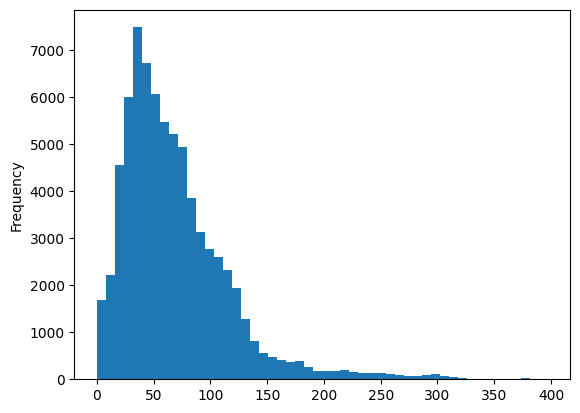

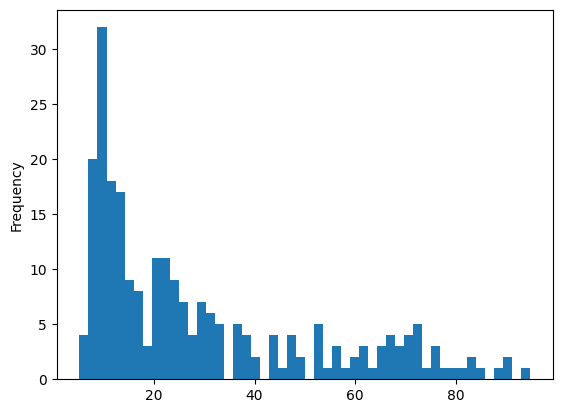

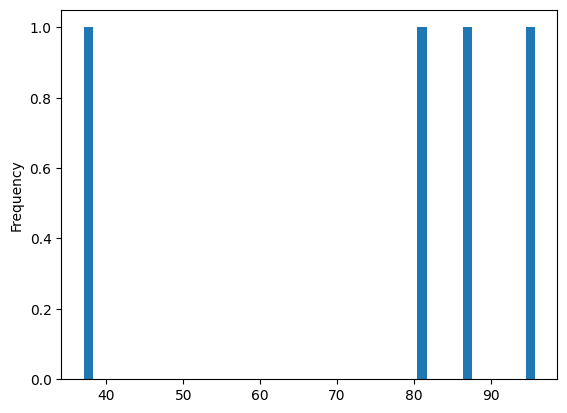

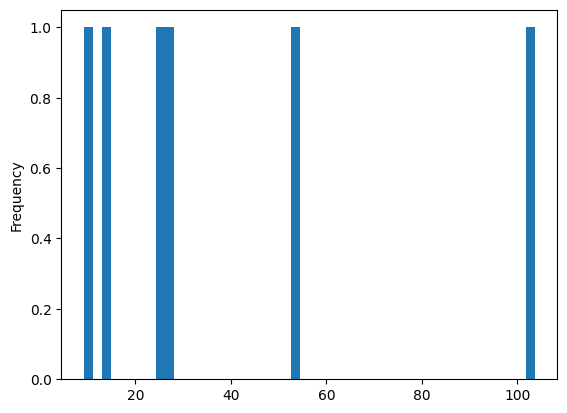

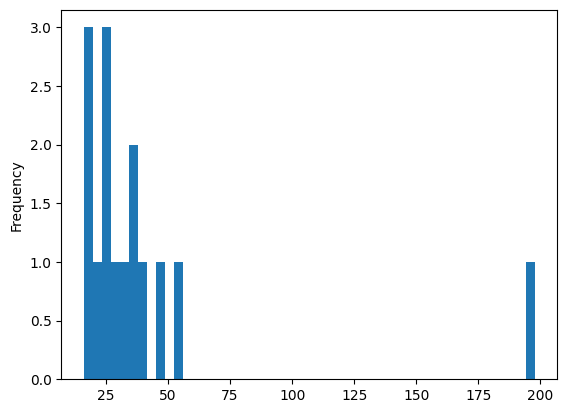

In [83]:
for borough in data_pd['borough'].unique():
    plt.figure()  # Create a new figure for each borough
    data_pd[data_pd['borough'] == borough]['z_floor'].plot.hist(bins=50)

In [84]:
data_pd.the_geom.value_counts()

the_geom
POINT (-74.14496608323941 40.61608223015765)     1
POINT (-74.22274561187417 40.52134422844183)     1
POINT (-74.24179250549321 40.52875316810818)     1
POINT (-74.24109012652094 40.528883822921635)    1
POINT (-74.24649640323727 40.507045708438184)    1
                                                ..
POINT (-74.24365222792362 40.511312884663575)    1
POINT (-74.25105070554271 40.509441862704946)    1
POINT (-74.23783472964344 40.501694739226224)    1
POINT (-74.23768831111624 40.502538783400325)    1
POINT (-74.23785748884656 40.501837069913684)    1
Name: count, Length: 73915, dtype: int64

In [85]:
data_pd.the_geom.describe()

count                                            73915
unique                                           73915
top       POINT (-74.14496608323941 40.61608223015765)
freq                                                 1
Name: the_geom, dtype: object

In [86]:
data_pd.z_floor.sum()

np.float64(5089579.907)

Text(0.5, 1.0, 'Total z_floor by borough type')

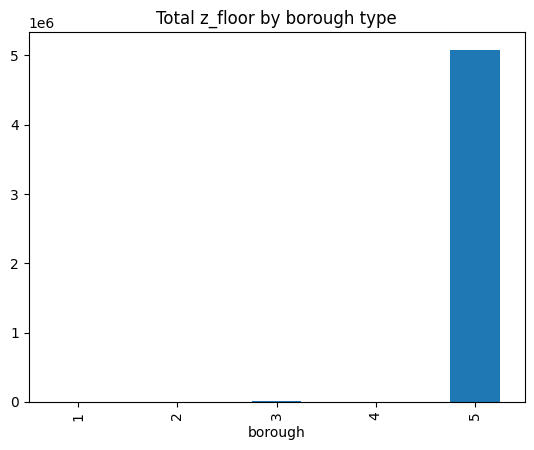

In [87]:
data_pd.groupby("borough").z_floor.sum().plot.bar()
plt.title("Total z_floor by borough type")

Text(0.5, 1.0, 'Average z_floor by borough Type')

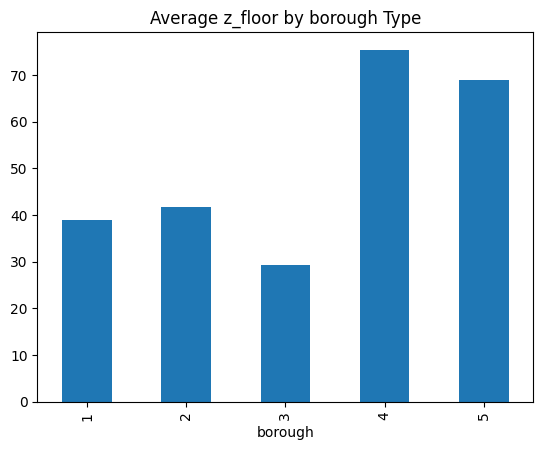

In [88]:
avr_z_floor=data_pd.groupby("borough")['z_floor'].mean()
avr_z_floor.plot.bar()
plt.title('Average z_floor by borough Type')

In [89]:
data_pd.address.describe()

count                    70051
unique                   67141
top       910 ROSSVILLE AVENUE
freq                       228
Name: address, dtype: object

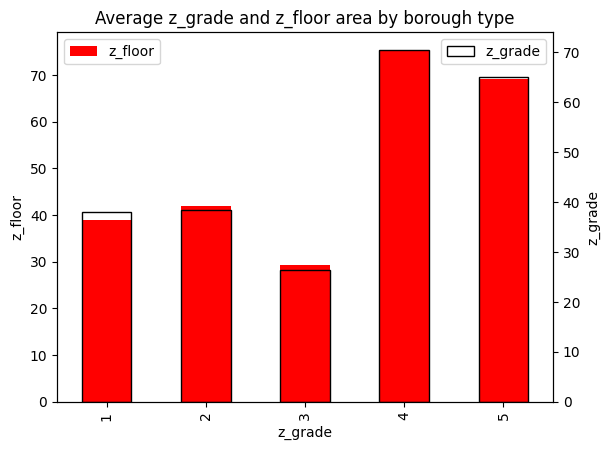

In [90]:
# plot both lot and building area on the same plot with a secondary y-axis
fig, ax = plt.subplots()
by_z_floor = data_pd.groupby("borough").z_floor.mean()
by_z_floor.plot.bar(ax=ax, color="red")

# get order to apply below
order = {v: i for i, v in enumerate(by_z_floor.index)}

ax.set_ylabel("z_floor")
ax.set_xlabel("z_grade")

ax2 = ax.twinx()
data_pd.groupby("borough").z_grade.mean().reindex(by_z_floor.index).plot.bar(
    ax=ax2, edgecolor="black", color="none"
)
ax2.set_ylabel("z_grade")

plt.title("Average z_grade and z_floor area by borough type")

# add legends
ax.legend(["z_floor"], loc="upper left")
ax2.legend(["z_grade"], loc="upper right")

<Axes: title={'center': 'z_floor'}, xlabel='borough'>

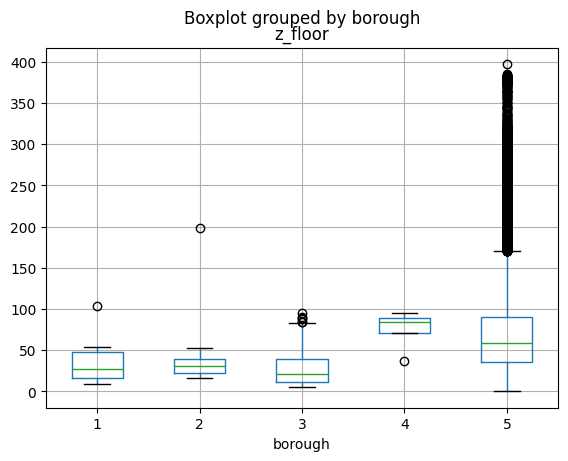

In [91]:
data_pd.boxplot(column="z_floor", by="borough")

<Axes: title={'center': 'z_grade'}, xlabel='borough'>

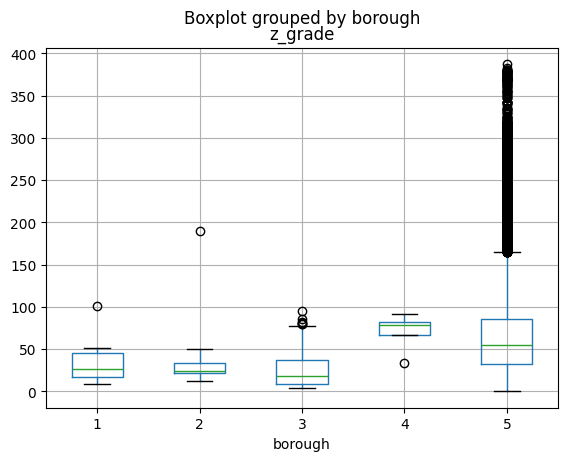

In [92]:
data_pd.boxplot(column="z_grade", by="borough")

<Axes: >

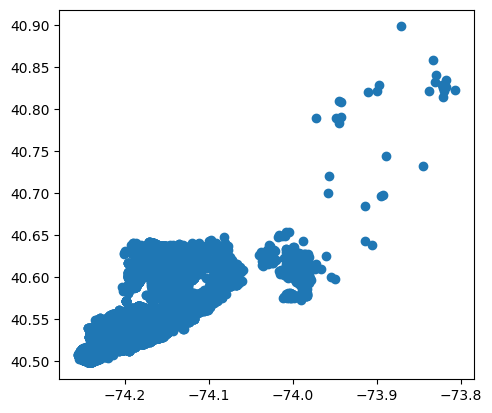

In [93]:
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(data_pd['longitude'], data_pd['latitude'])]
gdf = gpd.GeoDataFrame(data_pd, geometry=geometry)
gdf.plot()

<Axes: >

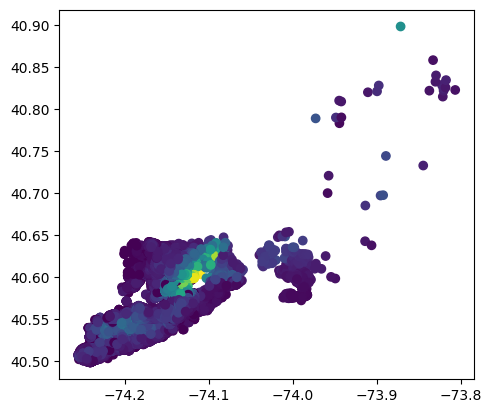

In [94]:
gdf.plot(column='z_floor')

<Axes: >

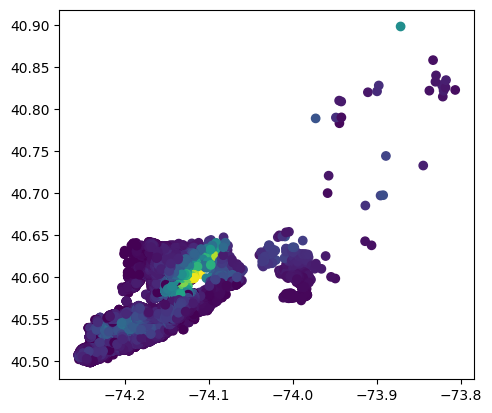

In [95]:
gdf.plot(column="z_grade")

In [96]:
data_pd.longitude.describe()

count    73915.000000
mean       -74.168478
std          0.034718
min        -74.255266
25%        -74.190879
50%        -74.162266
75%        -74.145693
max        -73.806872
Name: longitude, dtype: float64

In [97]:
COLOR = [
    [240, 249, 232],
    [204, 235, 197],
    [168, 220, 184],
    [123, 204, 196],
    [78, 179, 211],
    [43, 140, 190],
    [8, 104, 172],
    [8, 64, 129]
]

In [98]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5)
data_pd["cluster"] = kmeans.fit_predict(data_pd[["longitude", "latitude"]])

sampled_data = data_pd.groupby("cluster").apply(lambda x: x.sample(frac=0.1))
sampled_data = sampled_data.reset_index(drop=True)

C:\Users\王小雅\AppData\Local\Temp\ipykernel_33272\4235233483.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_data = data_pd.groupby("cluster").apply(lambda x: x.sample(frac=0.1))


In [99]:
import pydeck as pdk
layer = pdk.Layer(
    "ScatterplotLayer",
    data=sampled_data,
    get_position=["longitude", "latitude"],
    get_color="[200, 30, 0, 160]",
    get_radius="z_floor" ,  
    pickable=True  
)

view_state = pdk.ViewState(
    longitude=data_pd["longitude"].mean(),
    latitude=data_pd["latitude"].mean(),
    zoom=10,
    min_zoom=5,
    max_zoom=15,
    pitch=45,
    bearing=0
)

In [100]:
view_state = pdk.ViewState(
    longitude=sampled_data["longitude"].mean(),
    latitude=sampled_data["latitude"].mean(),
    zoom=10,
    min_zoom=5,
    max_zoom=15,
    pitch=45,
    bearing=0
)

In [101]:
deck = pdk.Deck(
    layers=[layer],
    initial_view_state=view_state,
    map_style="light", 
    tooltip={"text": "z_floor"}  
)

deck.show()